In [42]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [43]:
from plotnine import *
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colors
import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
import anndata as ad
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay
from data_loader import load_xenium_breast_cancer

from prismo.prismo import PRISMO
from prismo import feature_sets
from prismo.plotting import plot_variance_explained, plot_factor_correlation, plot_weights

tab20 = plt.get_cmap('tab20').colors
tab20 = [colors.rgb2hex(color) for color in tab20]

In [44]:
model = PRISMO.load("/data/florin/prismo_project/prismo-analysis/application_xenium/breast_cancer_factors_3_hallmark_30_hvg_4110_seed_59283")

/data/florin/prismo_project/prismo/src/prismo/io.py:241: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


In [45]:
def to_upper(feature_set_collection):
    return feature_sets.FeatureSets(
        [
            feature_sets.FeatureSet([f.upper() for f in fs], fs.name)
            for fs in feature_set_collection
        ],
        name=feature_set_collection.name,
    )

data = load_xenium_breast_cancer()
sc.pp.highly_variable_genes(data["group_chromium"]["rna"], subset=True, n_top_genes=4000)
data["group_chromium"]["rna"].var_names = (data["group_chromium"]["rna"].var["symbol"].astype(str))
data["group_xenium"]["rna"].var_names = (data["group_xenium"]["rna"].var["symbol"].astype(str))

# load annotations
gene_set_collection = to_upper(feature_sets.from_gmt(
    "../msigdb/h.all.v7.5.1.symbols.gmt", name="hallmark"
))

gene_set_collection.keep(model.factor_names)

# create gene set masks for each group
data["group_chromium"]["rna"].varm["gene_set_mask"] = gene_set_collection.to_mask(
    data["group_chromium"]["rna"].var_names.tolist()
).T

data["group_xenium"]["rna"].varm["gene_set_mask"] = gene_set_collection.to_mask(
    data["group_xenium"]["rna"].var_names.tolist()
).T

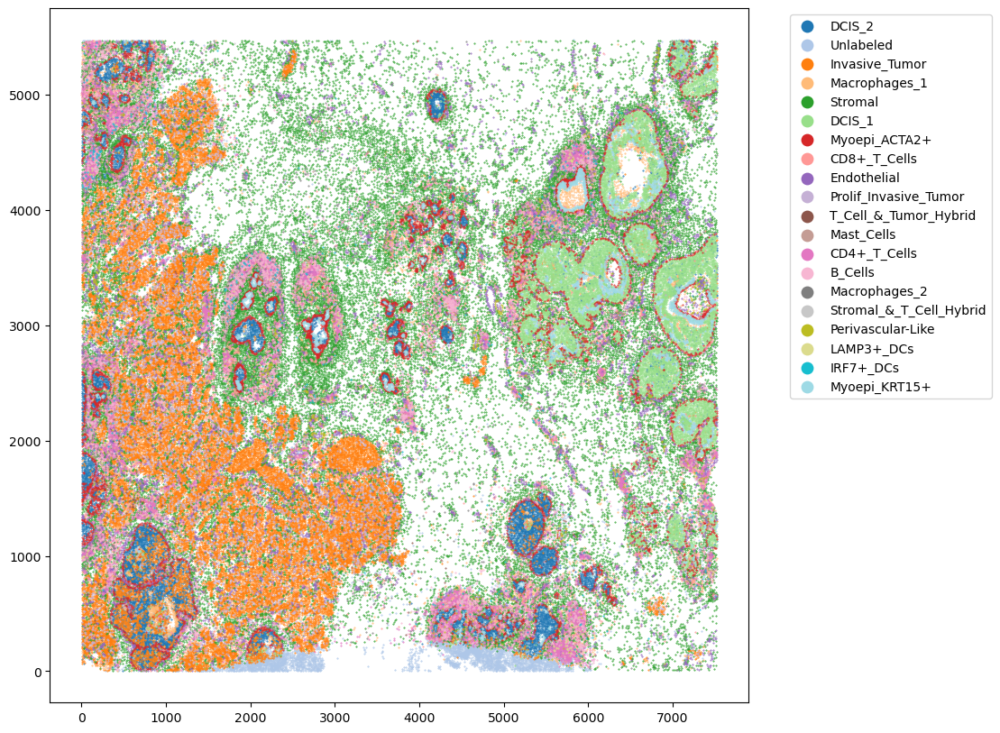

In [46]:
adata = data["group_xenium"]["rna"]

fig, ax = plt.subplots(figsize=(10, 10))
for i, celltype in enumerate(adata.obs.celltype.unique()):
    adata_subset = adata[adata.obs["celltype"] == celltype]
    ax.scatter(adata_subset.obsm["spatial"][:, 0], adata_subset.obsm["spatial"][:, 1], s=0.2, label=celltype, color=plt.get_cmap("tab20")(i))
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=20)
plt.show()

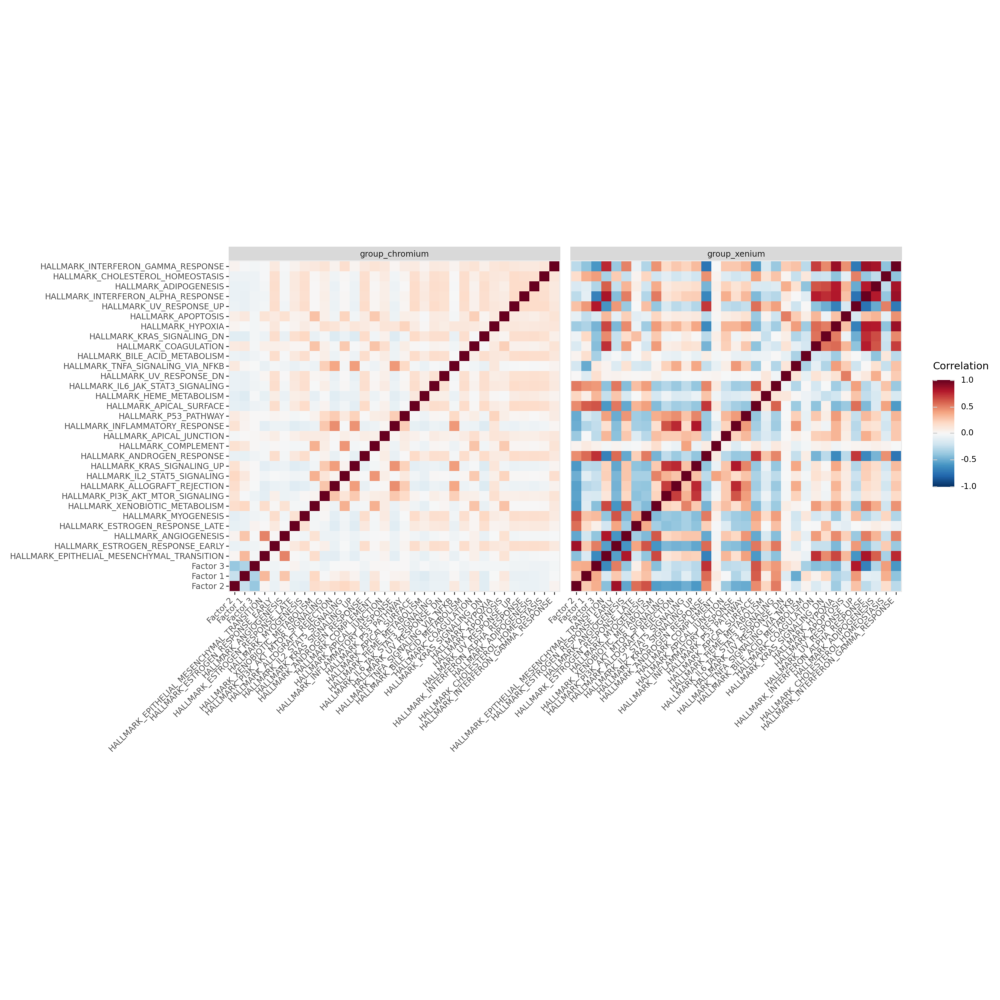

In [47]:
plot_factor_correlation(model, figsize=(15, 15))

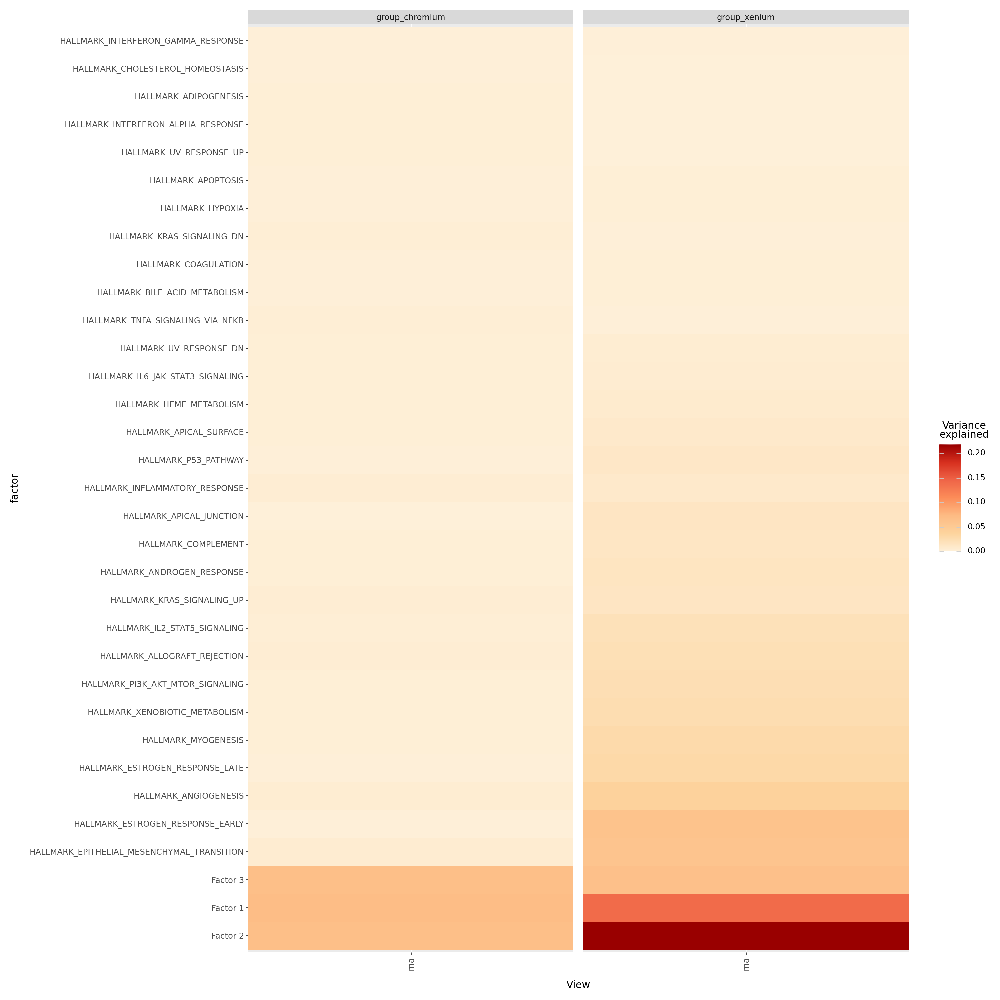

In [48]:
plot_variance_explained(model, figsize=(15, 15))

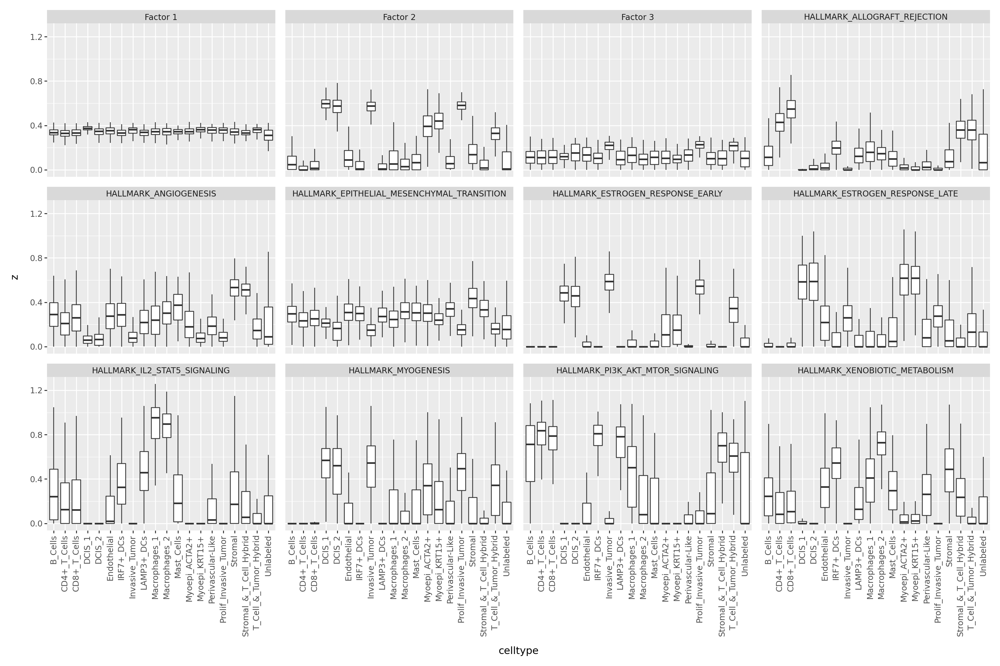

In [49]:
z_adata = model.get_factors("anndata")["group_xenium"]
z_df = pd.concat([z_adata.to_df(), z_adata.obs["celltype"]], axis=1)

z_df_long = z_df.melt(id_vars="celltype", var_name="factor", value_name="z")
z_df_long = z_df_long[z_df_long["factor"].isin(model.factor_names[:12])]

plot = (
    ggplot(z_df_long, aes(x="celltype", y="z"))
    + geom_boxplot(outlier_shape="")
    + theme(
        figure_size=(15, 10),
        axis_text_x=element_text(rotation=90),
    )
    + facet_wrap("~factor")

)
plot.show()

In [50]:
w = model.get_weights("pandas")["rna"].T.drop(columns=["Factor 1", "Factor 2", "Factor 3"])

gene_set_mask_xenium = data["group_xenium"]["rna"].varm["gene_set_mask"]
gene_set_mask_chromium = data["group_chromium"]["rna"].varm["gene_set_mask"]
gene_set_mask_xenium = gene_set_mask_xenium.loc[~gene_set_mask_xenium.index.isin(gene_set_mask_chromium.index)]
gene_set_mask = pd.concat([gene_set_mask_xenium, gene_set_mask_chromium], axis=0)
gene_set_mask = gene_set_mask.loc[:, w.columns]


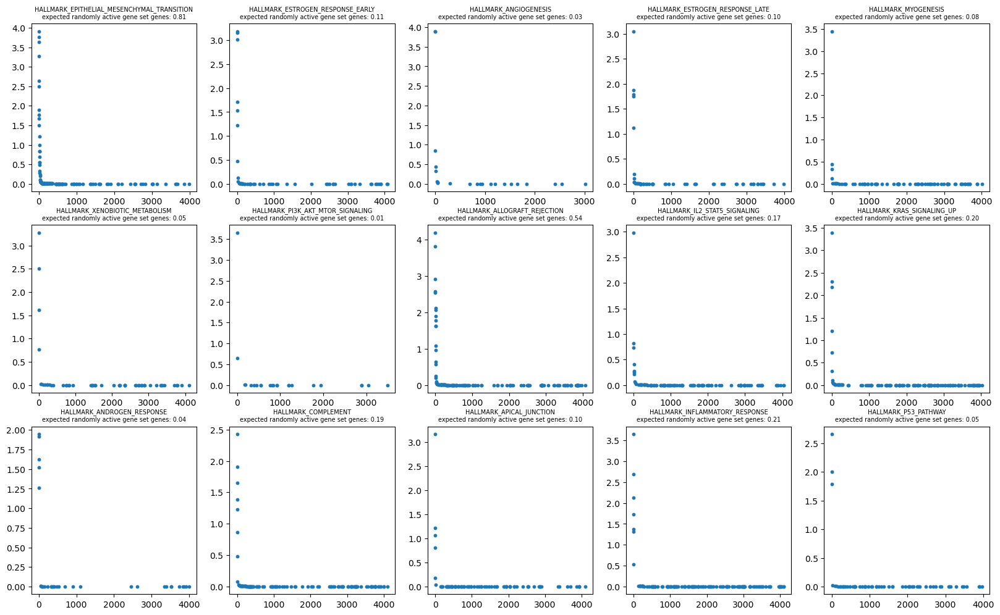

In [51]:
fig, axs = plt.subplots(3, 5, figsize=(20, 12))

for i, factor in enumerate(w.columns[:15]):
    ax = axs.flatten()[i]
    df = pd.merge(w[[factor]], gene_set_mask[[factor]], left_index=True, right_index=True, suffixes=("_w", "_mask"))
    df = df.sort_values(f"{factor}_w", ascending=False)
    df_subset = df[df[f"{factor}_mask"] == True]
    ax.scatter(np.where(df[f"{factor}_mask"] == True), df_subset[f"{factor}_w"], s=10)

    # given the number of active genes in the factor (>0.1 weight), how many genes are expected to be randomly active in the gene set
    expected_active_in_gene_set = df_subset.shape[0] / df.shape[0] * (df_subset[f"{factor}_w"] > 0.1).sum()
    ax.set_title(f"{factor}\nexpected randomly active gene set genes: {expected_active_in_gene_set:.2f}", fontdict={"fontsize" : 7})


plt.show()

In [52]:
z_adata = model.get_factors("anndata")["group_xenium"]
z_df = pd.concat([z_adata.to_df(), z_adata.obs[["celltype"]]], axis=1)

# load cellcompass results
nc = ad.read_h5ad("xenium_human_breast_cancer_analysis.h5ad")
nc = nc[nc.obs["replicates"] == "Rep_1"]
nc.obs.set_index("cell_id", inplace=True)
nc = nc[nc.obs.index.argsort()]

z_df = pd.merge(z_df, nc.obs, left_index=True, right_index=True, how="left")

/data/florin/micromamba/envs/prismo/lib/python3.11/site-packages/pandas/core/frame.py:6191: ImplicitModificationWarning: Trying to modify index of attribute `.obs` of view, initializing view as actual.
/data/florin/micromamba/envs/prismo/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.


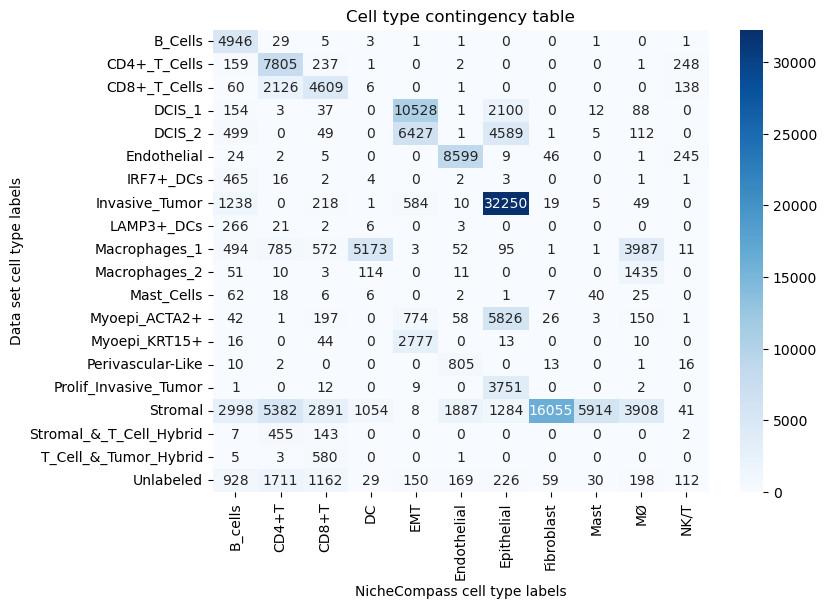

In [53]:
table = pd.crosstab(z_df["celltype"], z_df["cell_type"])

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(table, annot=True, cmap='Blues', fmt='d')
plt.xlabel('NicheCompass cell type labels')
plt.ylabel('Data set cell type labels')
plt.title('Cell type contingency table')
plt.show()

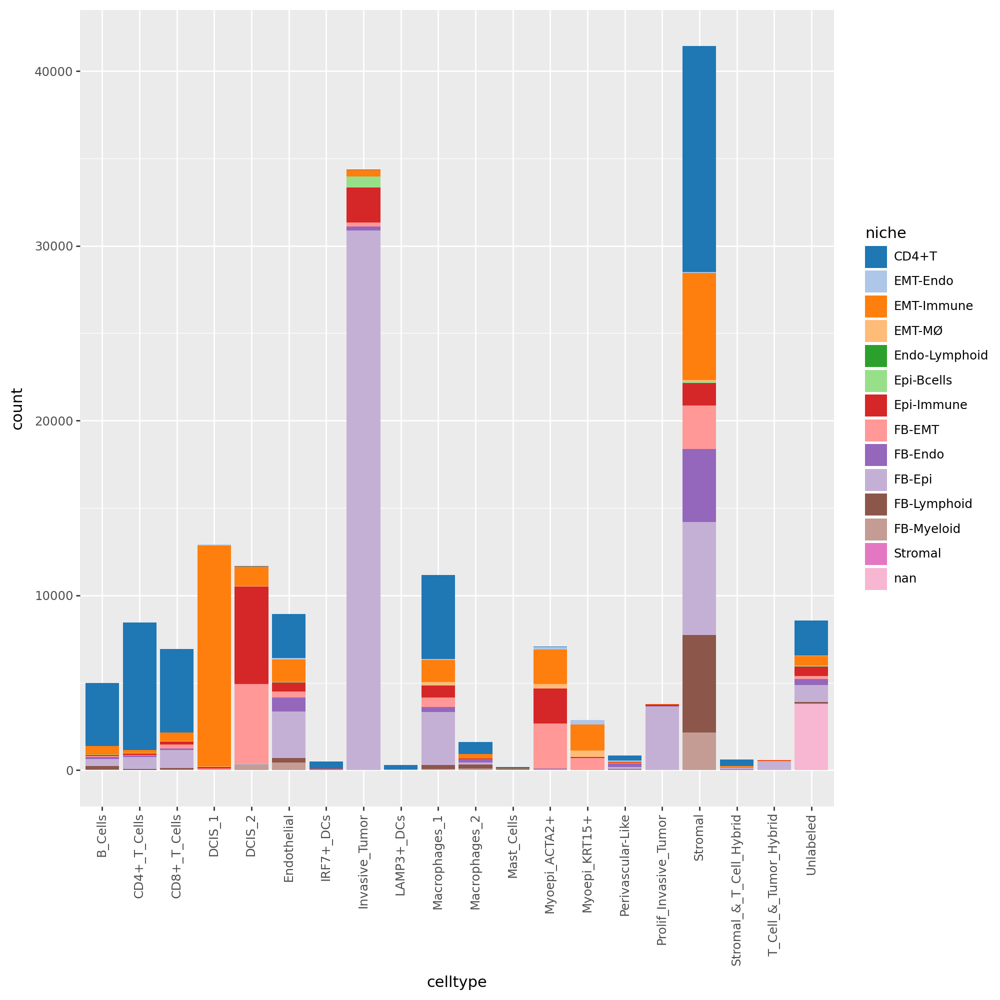

In [54]:
plot = (
    ggplot(z_df[["celltype", "niche"]].astype(str), aes(x="celltype", fill="niche"))
    + geom_bar(position="stack")
    + theme(
        figure_size=(10, 10),
        axis_text_x=element_text(rotation=90),
    )
    + scale_fill_manual(values=tab20)
)
plot.show()

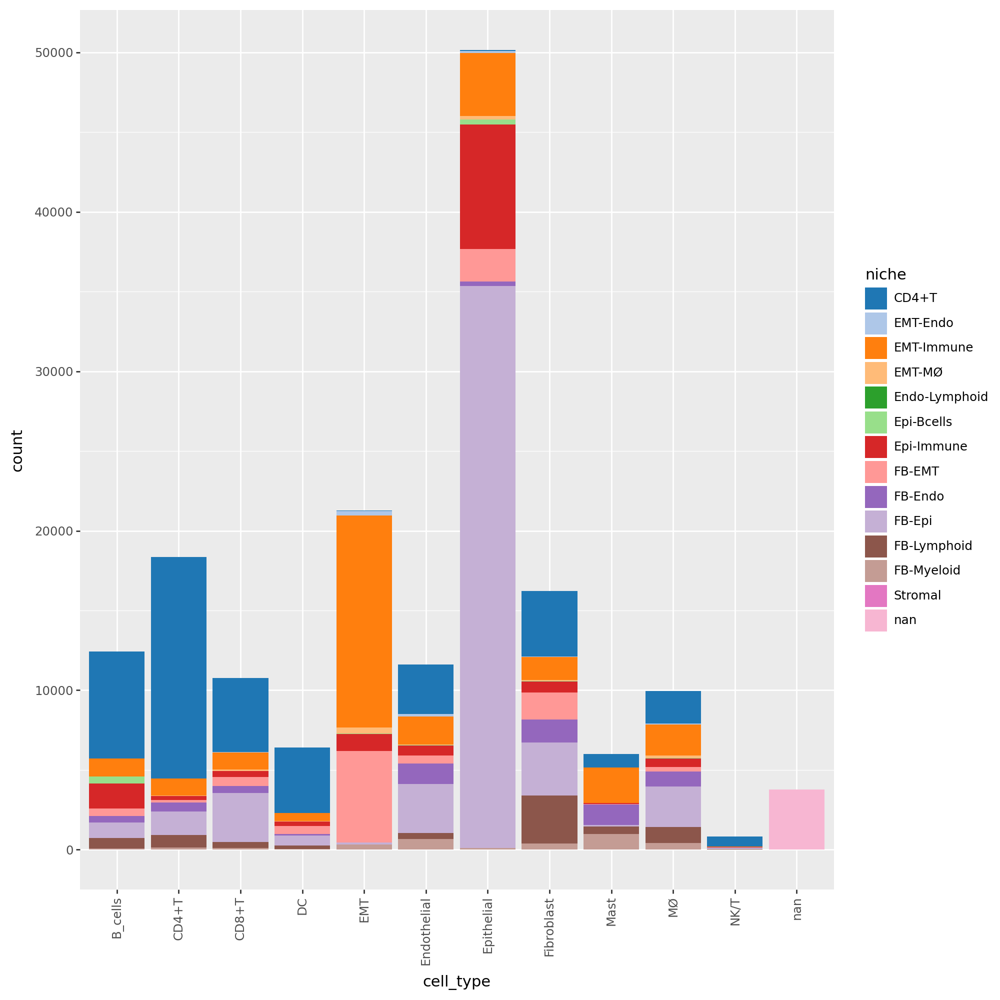

In [55]:
plot = (
    ggplot(z_df[["cell_type", "niche"]].astype(str), aes(x="cell_type", fill="niche"))
    + geom_bar(position="stack")
    + theme(
        figure_size=(10, 10),
        axis_text_x=element_text(rotation=90),
    )
    + scale_fill_manual(values=tab20)
)
plot.show()

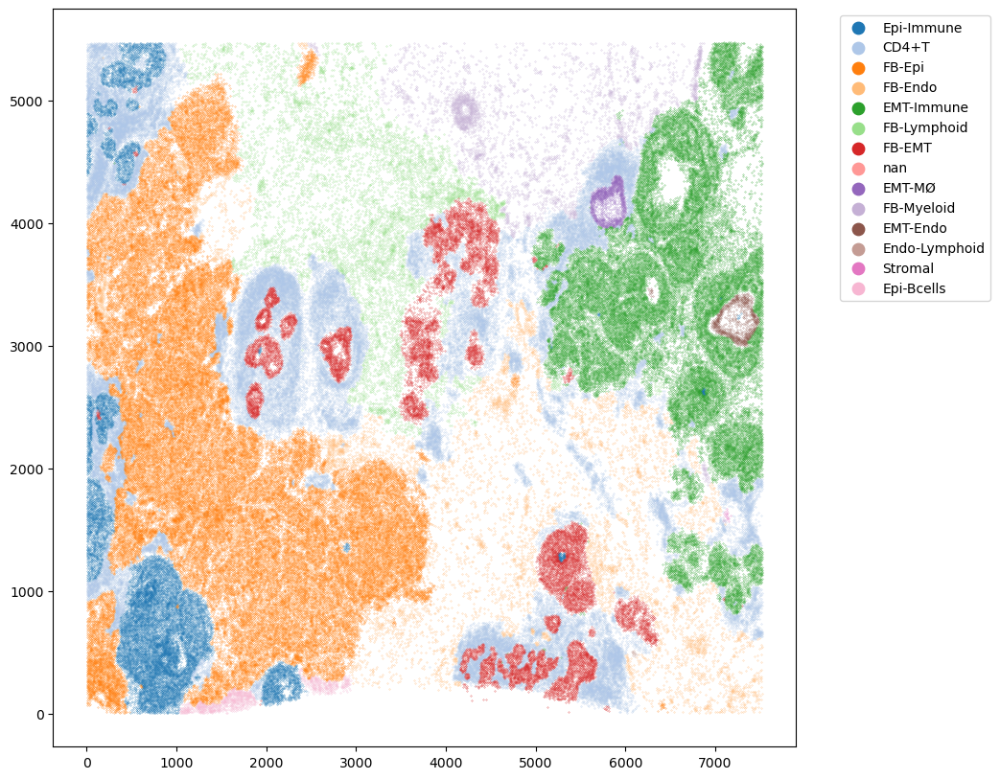

In [56]:
fig, ax = plt.subplots(figsize=(10, 10))
for i, niche in enumerate(z_df.niche.unique()):
    subset = z_df[z_df["niche"] == niche]
    ax.scatter(subset["x_centroid"], subset["y_centroid"], s=0.05, label=niche, color=plt.get_cmap("tab20")(i))
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=40)
plt.show()

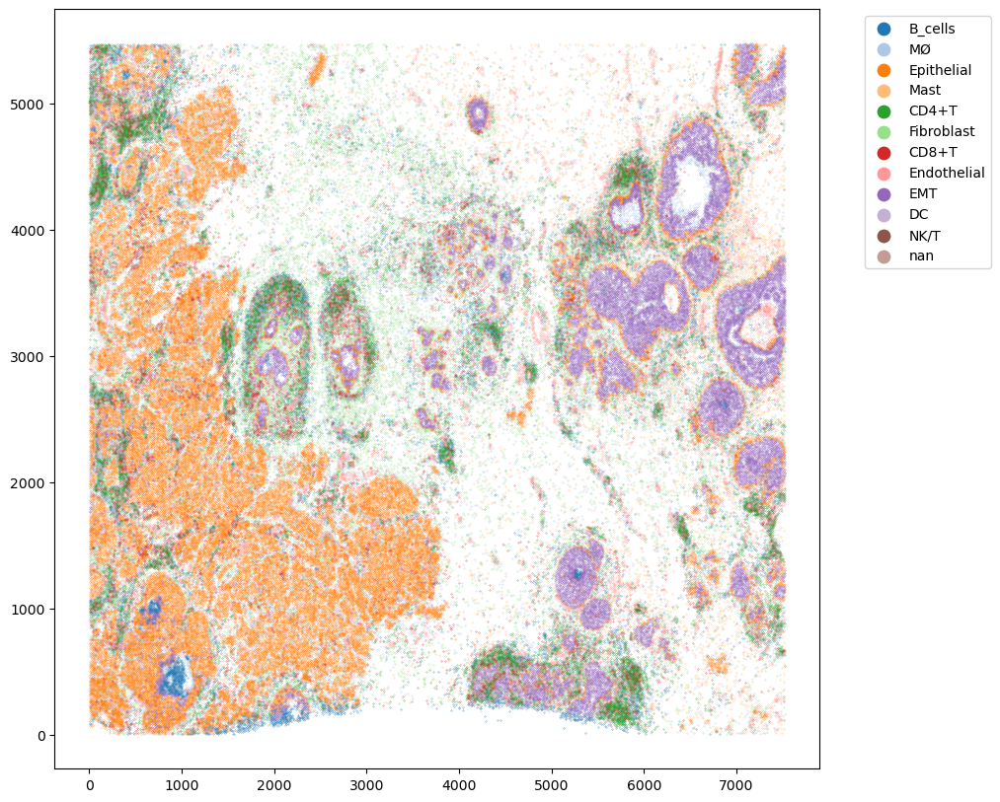

In [57]:
fig, ax = plt.subplots(figsize=(10, 10))
for i, cell_type in enumerate(z_df.cell_type.unique()):
    subset = z_df[z_df["cell_type"] == cell_type]
    ax.scatter(subset["x_centroid"], subset["y_centroid"], s=0.05, label=cell_type, color=plt.get_cmap("tab20")(i))
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=40)
plt.show()

/data/florin/micromamba/envs/prismo/lib/python3.11/site-packages/pandas/core/frame.py:6191: ImplicitModificationWarning: Trying to modify index of attribute `.obs` of view, initializing view as actual.
/data/florin/micromamba/envs/prismo/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.


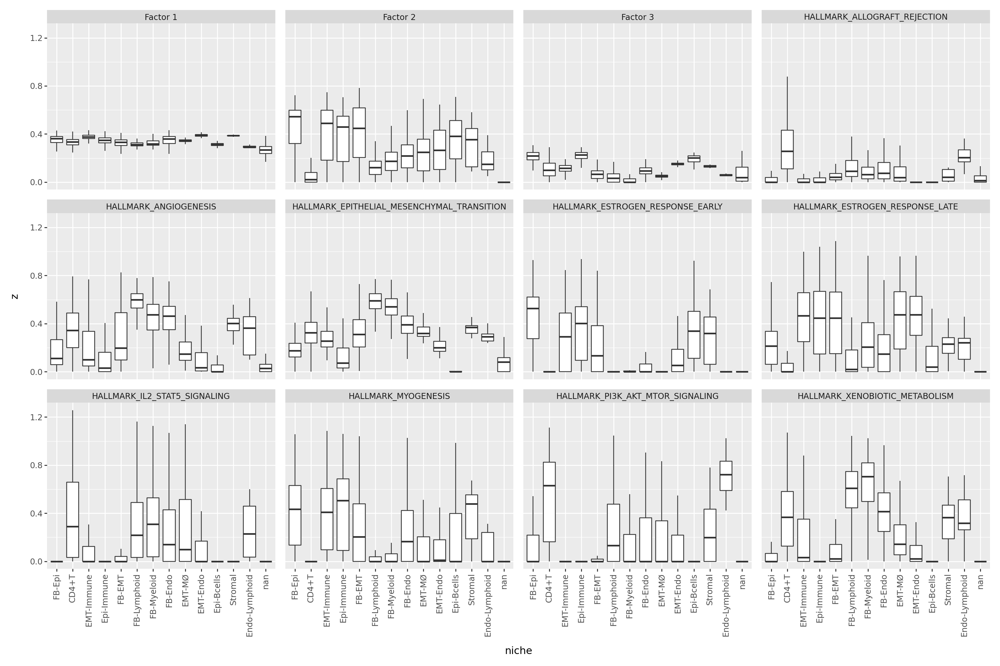

In [58]:
z_adata = model.get_factors("anndata")["group_xenium"]
z_df = pd.concat([z_adata.to_df(), z_adata.obs[["celltype"]]], axis=1)

# load cellcompass results
nc = ad.read_h5ad("xenium_human_breast_cancer_analysis.h5ad")
nc = nc[nc.obs["replicates"] == "Rep_1"]
nc.obs.set_index("cell_id", inplace=True)
nc = nc[nc.obs.index.argsort()]

z_df = pd.merge(z_df, nc.obs, left_index=True, right_index=True, how="left")


z_df_long = z_df.drop(columns=[x for x in nc.obs.columns if not x == "niche"] + ["celltype"]).melt(id_vars="niche", var_name="factor", value_name="z")
z_df_long = z_df_long[z_df_long["factor"].isin(model.factor_names[:12])]

plot = (
    ggplot(z_df_long, aes(x="niche", y="z"))
    + geom_boxplot(outlier_shape="")
    + theme(
        figure_size=(15, 10),
        axis_text_x=element_text(rotation=90),
    )
    + facet_wrap("~factor")

)
plot.show()

In [59]:
# for celltype in z_df["celltype"].unique():
#     z_df_subset = z_df[z_df["celltype"] == celltype]
#     z_df_subset = z_df_subset[list(model.factor_names[:15]) + ["niche"]]
#     include = (z_df_subset.groupby("niche").size() / z_df_subset.shape[0]) > 0.05
#     z_df_subset = z_df_subset[z_df_subset["niche"].isin(include[include].index)]
#     z_df_subset = z_df_subset.melt(id_vars="niche", var_name="factor", value_name="z")

#     plot = (
#         ggplot(z_df_subset, aes(x="factor", y="z", fill="niche"))
#         + geom_boxplot(outlier_shape="")
#         + theme(
#             figure_size=(20, 10),
#             axis_text_x=element_text(rotation=90),
#         )
#         + scale_fill_manual(values=tab20)
#         + labs(title=celltype)
#     )

#     plot.show()

/data/florin/micromamba/envs/prismo/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
/data/florin/micromamba/envs/prismo/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


               precision    recall  f1-score   support

        CD4+T       0.77      0.86      0.81      3986
     EMT-Endo       0.67      0.15      0.24        68
   EMT-Immune       0.89      0.91      0.90      2841
       EMT-MØ       0.91      0.46      0.61        92
Endo-Lymphoid       0.00      0.00      0.00         2
   Epi-Bcells       0.58      0.38      0.46        82
   Epi-Immune       0.80      0.74      0.77      1346
       FB-EMT       0.81      0.77      0.79      1231
      FB-Endo       0.62      0.39      0.48       669
       FB-Epi       0.89      0.91      0.90      5079
  FB-Lymphoid       0.76      0.71      0.73       670
   FB-Myeloid       0.89      0.74      0.81       333
      Stromal       0.00      0.00      0.00         1

     accuracy                           0.83     16400
    macro avg       0.66      0.54      0.58     16400
 weighted avg       0.83      0.83      0.83     16400



/data/florin/micromamba/envs/prismo/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
/data/florin/micromamba/envs/prismo/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


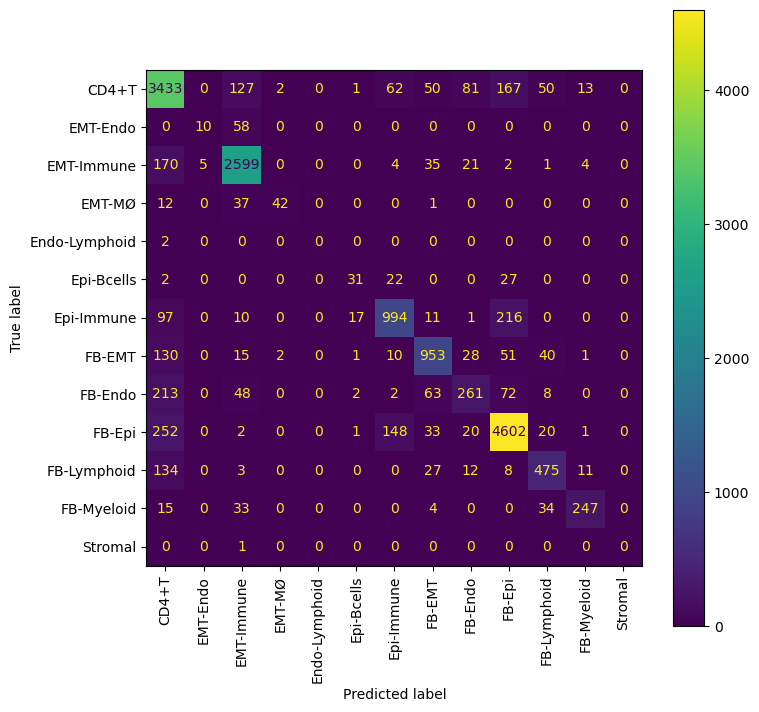

In [60]:
# niche prediction using all factors, no cell types

inds = ~z_df["niche"].isna()

X = z_df[inds].iloc[:, :33]
y = z_df[inds]["niche"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)

linear_model = LogisticRegression(max_iter=1000).fit(X_train.values, y_train.values)
y_pred = linear_model.predict(X_test)

conf_matrix = confusion_matrix(y_test, y_pred, labels=linear_model.classes_)
class_report = classification_report(y_test, y_pred)

print(class_report)

fig, ax = plt.subplots(figsize=(8, 8))
ConfusionMatrixDisplay(conf_matrix, display_labels=linear_model.classes_).plot(ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

/data/florin/micromamba/envs/prismo/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
/data/florin/micromamba/envs/prismo/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
/data/florin/micromamba/envs/prismo/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
/data/florin/micromamba/envs/prismo/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


                         precision    recall  f1-score   support

                B_Cells       0.74      0.70      0.72       496
           CD4+_T_Cells       0.65      0.75      0.70       857
           CD8+_T_Cells       0.65      0.63      0.64       687
                 DCIS_1       0.85      0.94      0.89      1240
                 DCIS_2       0.77      0.75      0.76      1126
            Endothelial       0.75      0.77      0.76       896
              IRF7+_DCs       0.60      0.14      0.22        44
         Invasive_Tumor       0.85      0.94      0.89      3491
             LAMP3+_DCs       0.80      0.15      0.25        27
          Macrophages_1       0.77      0.83      0.80      1144
          Macrophages_2       0.65      0.39      0.49       165
             Mast_Cells       0.00      0.00      0.00        13
          Myoepi_ACTA2+       0.76      0.68      0.72       728
          Myoepi_KRT15+       0.77      0.60      0.68       286
      Perivascular-Like 

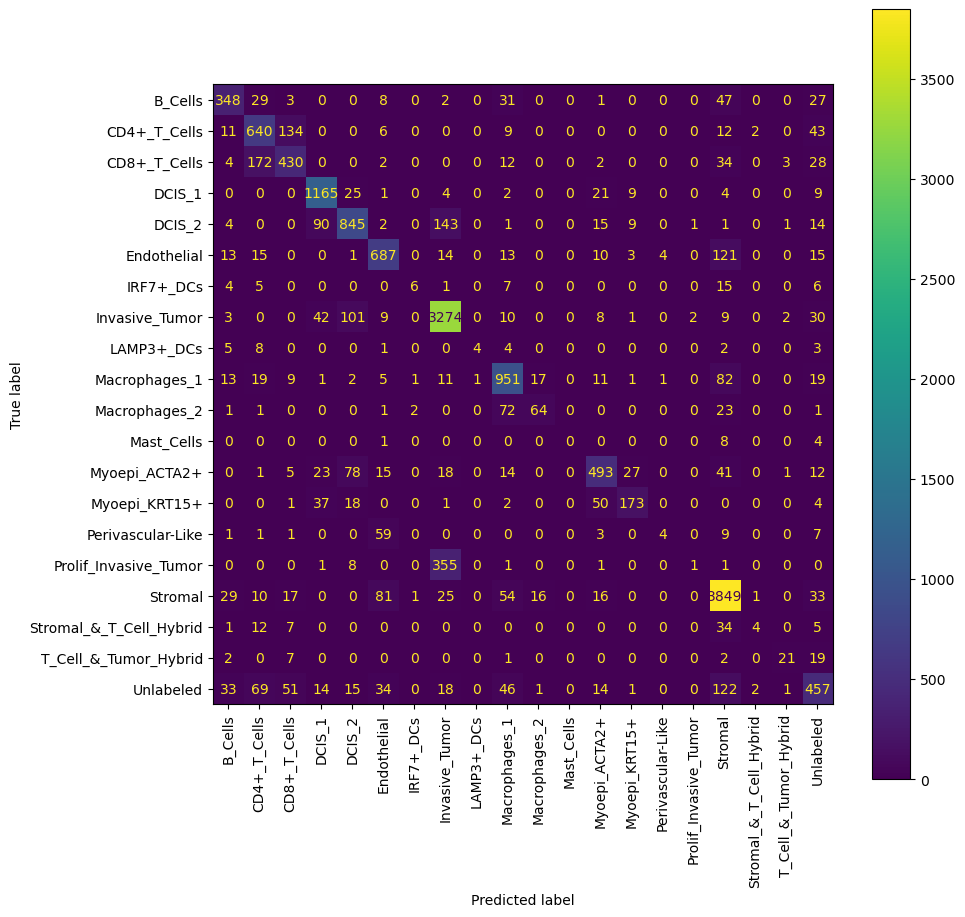

In [61]:
# cell type prediction using all factors, no cell types

inds = ~z_df["celltype"].isna()

X = z_df[inds].iloc[:, :33]
y = z_df[inds]["celltype"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)

linear_model = LogisticRegression(max_iter=1000).fit(X_train.values, y_train.values)
y_pred = linear_model.predict(X_test)

conf_matrix = confusion_matrix(y_test, y_pred, labels=linear_model.classes_)
class_report = classification_report(y_test, y_pred)

print(class_report)

fig, ax = plt.subplots(figsize=(10, 10))
ConfusionMatrixDisplay(conf_matrix, display_labels=linear_model.classes_).plot(ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

/data/florin/micromamba/envs/prismo/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
/data/florin/micromamba/envs/prismo/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


               precision    recall  f1-score   support

        CD4+T       0.78      0.87      0.82      4057
     EMT-Endo       0.91      0.31      0.47        64
   EMT-Immune       0.89      0.93      0.91      2840
       EMT-MØ       0.85      0.44      0.58       102
Endo-Lymphoid       0.00      0.00      0.00         1
   Epi-Bcells       0.63      0.40      0.49       100
   Epi-Immune       0.86      0.76      0.81      1282
       FB-EMT       0.86      0.80      0.83      1176
      FB-Endo       0.62      0.40      0.49       726
       FB-Epi       0.90      0.92      0.91      5010
  FB-Lymphoid       0.77      0.72      0.74       689
   FB-Myeloid       0.85      0.77      0.81       352
      Stromal       0.00      0.00      0.00         1

     accuracy                           0.85     16400
    macro avg       0.69      0.56      0.60     16400
 weighted avg       0.84      0.85      0.84     16400



/data/florin/micromamba/envs/prismo/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
/data/florin/micromamba/envs/prismo/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


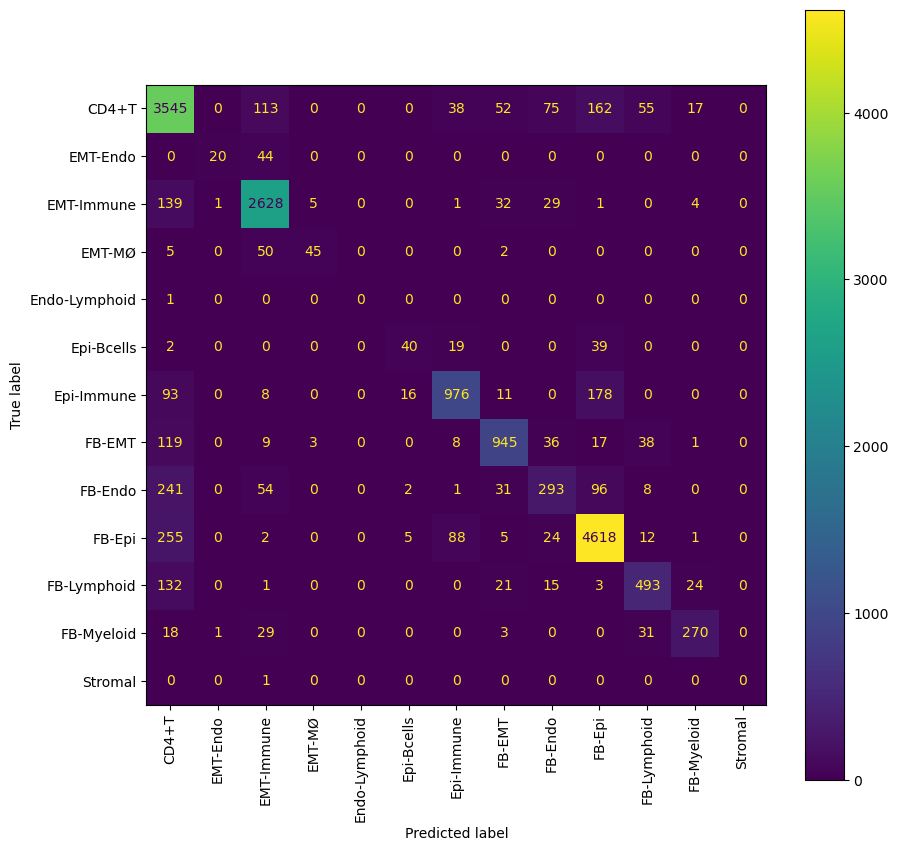

In [62]:
# niche prediction using all factors and cell types

inds = ~z_df["niche"].isna()

X = z_df[inds].iloc[:, :33]
celltype_one_hot = OneHotEncoder().fit_transform(z_df[inds]["celltype"].values.reshape(-1, 1)).toarray()
X = pd.concat([X, pd.DataFrame(celltype_one_hot, columns=[f"ct_{i}" for i in range(celltype_one_hot.shape[1])], index=X.index)], axis=1)
y = z_df[inds]["niche"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)

linear_model = LogisticRegression(max_iter=1000).fit(X_train.values, y_train.values)
y_pred = linear_model.predict(X_test)

conf_matrix = confusion_matrix(y_test, y_pred, labels=linear_model.classes_)
class_report = classification_report(y_test, y_pred)

print(class_report)

fig, ax = plt.subplots(figsize=(10, 10))
ConfusionMatrixDisplay(conf_matrix, display_labels=linear_model.classes_).plot(ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

In [63]:
celltypes_selection = ["Stromal", "Invasive_Tumor", "DCIS_1", "DCIS_2", "Macrophages_1", "Endothelial", "CD4+_T_Cells", "Myoepi_ACTA2+", "CD8+_T_Cells", "B_Cells", "Prolif_Invasive_Tumor"]

celltypes_adatas = {}
for celltype in celltypes_selection:
    factors_adata = model.get_factors("anndata")["group_xenium"]
    factors_adata = factors_adata[factors_adata.obs["celltype"] == celltype]
    sc.pp.neighbors(factors_adata)
    sc.tl.leiden(factors_adata, flavor="igraph", n_iterations=2)
    sc.tl.umap(factors_adata)
    celltypes_adatas[celltype] = factors_adata.copy()

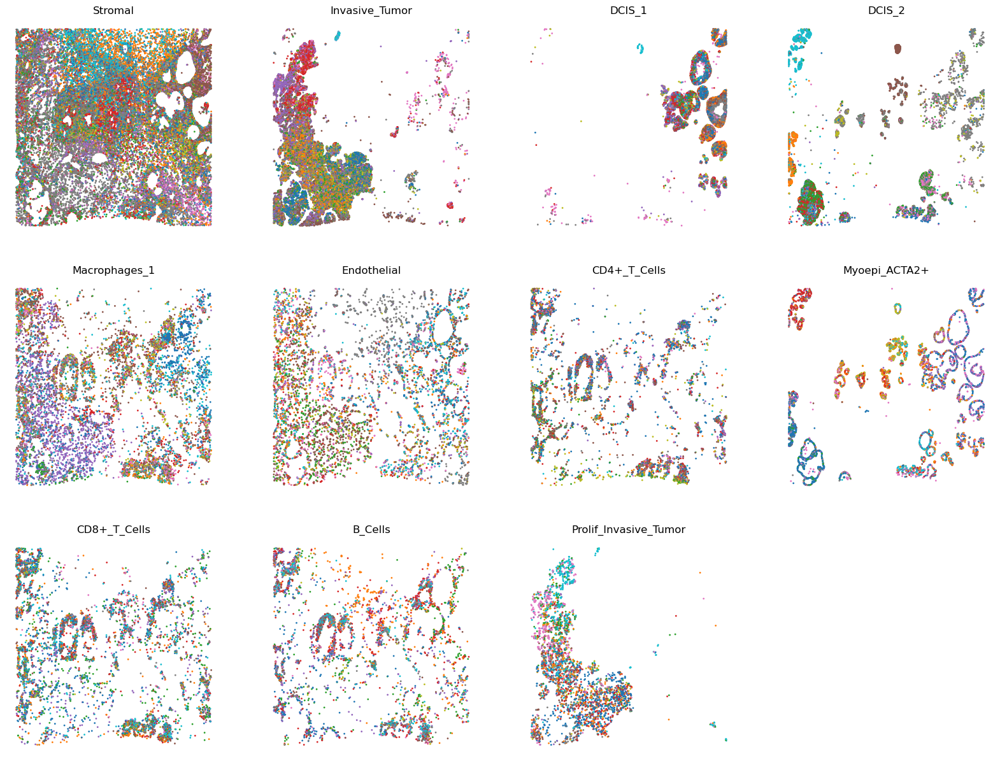

In [66]:
fig, axs = plt.subplots(3, 4, figsize=(20, 15))

for i, celltype in enumerate(celltypes_selection):
    ax = axs.flatten()[i]
    ax.scatter(celltypes_adatas[celltype].obs["x_centroid"], celltypes_adatas[celltype].obs["y_centroid"], c=celltypes_adatas[celltype].obs["leiden"].cat.codes, s=1., cmap="tab10")
    ax.axis("off")
    ax.set_title(celltype)

axs.flatten()[-1].axis("off")
plt.show()


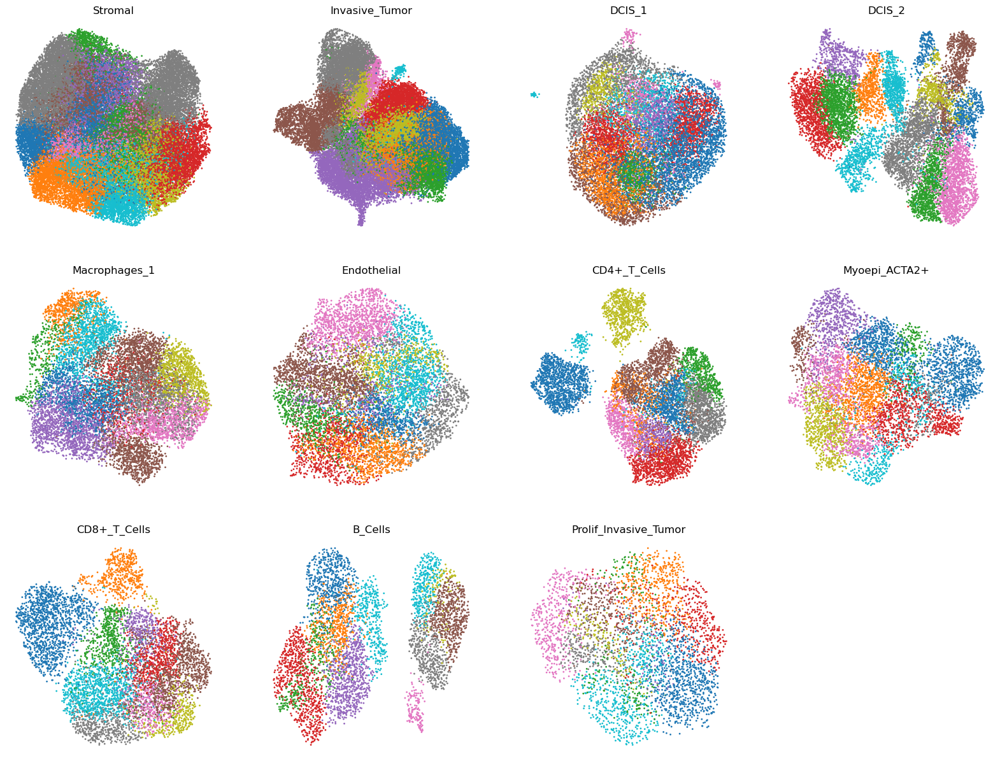

In [71]:
fig, axs = plt.subplots(3, 4, figsize=(20, 15))

for i, celltype in enumerate(celltypes_selection):
    ax = axs.flatten()[i]
    ax.scatter(celltypes_adatas[celltype].obsm["X_umap"][:, 0], celltypes_adatas[celltype].obsm["X_umap"][:, 1], c=celltypes_adatas[celltype].obs["leiden"].cat.codes, s=1., cmap="tab10")
    ax.axis("off")
    ax.set_title(celltype)

axs.flatten()[-1].axis("off")
plt.show()


In [75]:
model._annotations["rna"

AttributeError: 'numpy.ndarray' object has no attribute 'unique'